In [2]:
!pip3 install https://grid-devs.gitlab.io/ReNomTAG/bin/renom_tag-1.4b0-py3-none-any.whl

     |████████████████████████████████| 1.0MB 30.0MB/s 
     |████████████████████████████████| 2.0MB 2.8MB/s 
     |████████████████████████████████| 71kB 6.3MB/s 
     |████████████████████████████████| 194kB 21.3MB/s 
     |████████████████████████████████| 573kB 18.4MB/s 
     |████████████████████████████████| 5.7MB 28.0MB/s 
     |████████████████████████████████| 102kB 8.9MB/s 
     |████████████████████████████████| 92kB 9.3MB/s 
     |████████████████████████████████| 61kB 6.4MB/s 
     |████████████████████████████████| 122kB 39.3MB/s 
  Created wheel for bottle: filename=bottle-0.12.13-cp36-none-any.whl size=87533 sha256=205d6d561b006d72378c5b7db474a16e535d0a2d8a84a8a2edbb87bb8b19ea01
  Stored in directory: /root/.cache/pip/wheels/76/a0/b4/2a3ee1a32d0506931e558530258de1cc04b628eff1b2f008e0
  Created wheel for glob2: filename=glob2-0.6-py2.py3-none-any.whl size=9304 sha256=e7fc6e11933bca16fabe4f2405e9b99e27997c7fa010768dc09de19cf418d46c
  Stored in directory: /root/.cache/pip

In [3]:
!pip install h5py

In [4]:
!pip install renom-q

     |████████████████████████████████| 61kB 1.9MB/s 


In [5]:
!git clone https://github.com/ReNom-dev-team/ReNom.git

Cloning into 'ReNom'...
remote: Enumerating objects: 33079, done.
remote: Total 33079 (delta 0), reused 0 (delta 0), pack-reused 33079
Receiving objects: 100% (33079/33079), 28.80 MiB | 21.20 MiB/s, done.
Resolving deltas: 100% (9937/9937), done.


In [6]:
cd ReNom

/content/ReNom


In [7]:
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd 
import numpy as np 
from sklearn.model_selection import train_test_split
from copy import deepcopy
from sklearn.preprocessing import StandardScaler

import renom as rm
from renom.optimizer import Adam
from renom.cuda import set_cuda_active
set_cuda_active(False)

In [8]:
import pandas as pd
from google.colab import files

In [9]:
uploaded = files.upload()

Saving 2018.csv to 2018.csv


In [11]:
for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

User uploaded file "2018.csv" with length 16318212 bytes


In [12]:
uploaded

{'2018.csv': b'FL_DATE,ACTUAL_ELAPSED_TIME\r\n01/01/2018,250\r\n02/01/2018,83\r\n03/01/2018,126\r\n04/01/2018,182\r\n05/01/2018,106\r\n06/01/2018,79\r\n07/01/2018,193\r\n08/01/2018,102\r\n09/01/2018,299\r\n10/01/2018,237\r\n11/01/2018,296\r\n12/01/2018,80\r\n13/01/2018,347\r\n14/01/2018,140\r\n15/01/2018,118\r\n16/01/2018,338\r\n17/01/2018,339\r\n18/01/2018,149\r\n19/01/2018,206\r\n20/01/2018,92\r\n21/01/2018,131\r\n22/01/2018,213\r\n23/01/2018,189\r\n24/01/2018,325\r\n25/01/2018,262\r\n26/01/2018,371\r\n27/01/2018,184\r\n28/01/2018,150\r\n29/01/2018,175\r\n30/01/2018,357\r\n31/01/2018,237\r\n01/02/2018,51\r\n02/02/2018,238\r\n03/02/2018,352\r\n04/02/2018,128\r\n05/02/2018,192\r\n06/02/2018,169\r\n07/02/2018,127\r\n08/02/2018,146\r\n09/02/2018,200\r\n10/02/2018,189\r\n11/02/2018,249\r\n12/02/2018,157\r\n13/02/2018,213\r\n14/02/2018,233\r\n15/02/2018,158\r\n16/02/2018,92\r\n17/02/2018,165\r\n18/02/2018,68\r\n19/02/2018,199\r\n20/02/2018,293\r\n21/02/2018,81\r\n22/02/2018,122\r\n23/02/20

In [13]:
import pandas as pd
import io
df = pd.read_csv(io.StringIO(uploaded['2018.csv'].decode('utf-8')),parse_dates=['FL_DATE'], index_col='FL_DATE')
print(df)# standardize


            ACTUAL_ELAPSED_TIME
FL_DATE                        
2018-01-01                250.0
2018-02-01                 83.0
2018-03-01                126.0
2018-04-01                182.0
2018-05-01                106.0
...                         ...
2018-02-26                105.0
2018-02-26                109.0
2018-02-26                112.0
2018-02-26                153.0
2018-02-26                 94.0

[1048575 rows x 1 columns]


In [14]:
df = df.replace(np.nan, 0)

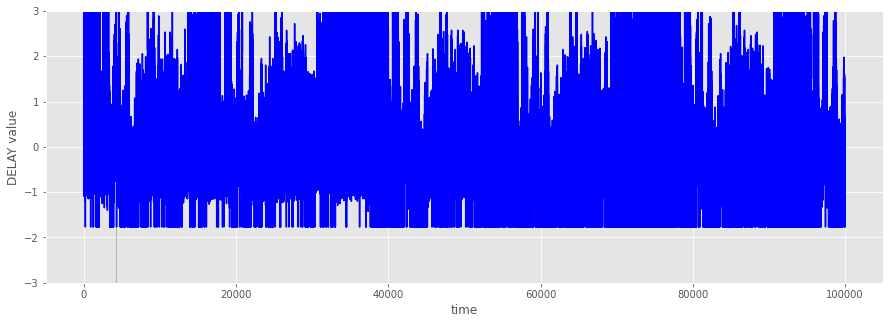

In [34]:
# standardize
scaler = StandardScaler()
std_DELAY = scaler.fit_transform(df)

plt.style.use('ggplot')
plt.figure(figsize=(15,5))
plt.xlabel('time')
plt.ylabel('DELAY value')
plt.plot(np.arange(100000), std_DELAY[:100000], color='b')
plt.ylim(-3, 3)
x = np.arange(4200,4400)
y1 = [-3]*len(x)
y2 = [3]*len(x)
plt.fill_between(x, y1, y2, facecolor='g', alpha=.3)
plt.show()

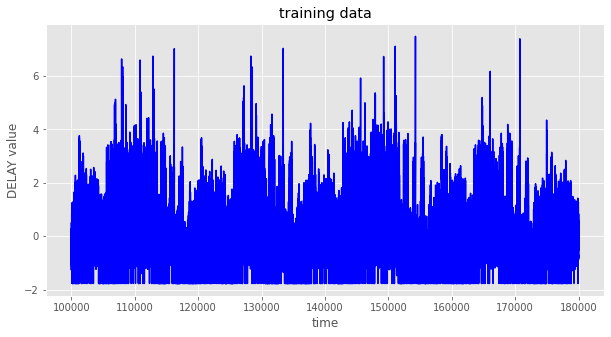

In [40]:
normal_cycle = std_DELAY[100000:]

plt.figure(figsize=(10,5))
plt.title("training data")
plt.xlabel('time')
plt.ylabel('DELAY value')
plt.plot(np.arange(100000,180000), normal_cycle[:80000], color='b')# stop plot at 8000 times for friendly visual
plt.show()

In [41]:
# create data of the "look_back" length from time-series, "ts"
# and the next "pred_length" values as labels
def create_subseq(ts, look_back, pred_length):
    sub_seq, next_values = [], []
    for i in range(len(ts)-look_back-pred_length):  
        sub_seq.append(ts[i:i+look_back])
        next_values.append(ts[i+look_back:i+look_back+pred_length].T[0])
    return sub_seq, next_values

In [42]:
look_back = 10
pred_length = 3

sub_seq, next_values = create_subseq(normal_cycle, look_back, pred_length)


X_train, X_test, y_train, y_test = train_test_split(
    sub_seq, next_values, test_size=0.2)

X_train = np.array(X_train)
X_test = np.array(X_test)
y_train = np.array(y_train)
y_test = np.array(y_test)


train_size = X_train.shape[0]
test_size = X_test.shape[0]
print('train size:{}, test size:{}'.format(train_size, test_size))

train size:758849, test size:189713


In [43]:
# model definition
model = rm.Sequential([
    rm.Lstm(35),
    rm.Relu(),
    rm.Lstm(35),
    rm.Relu(),
    rm.Dense(pred_length)
    ])

In [44]:
# params
batch_size = 100
max_epoch = 2000
period = 10 # early stopping checking period
optimizer = Adam()

In [45]:
# computing errors
for t in range(look_back):
    pred = model(X_test[:,t])
model.truncate()
errors = y_test - pred

mean = sum(errors)/len(errors)

cov = 0
for e in errors:
    cov += np.dot((e-mean).reshape(len(e), 1), (e-mean).reshape(1, len(e)))
cov /= len(errors)

print('mean : ', mean)
print('cov : ', cov)

mean :  [ 0.00398175  0.02593934 -0.00388332]
cov :  [[0.9789379  0.434976   0.33644646]
 [0.434976   0.993225   0.4433907 ]
 [0.33644646 0.4433907  0.9873637 ]]


In [46]:
# calculate Mahalanobis distance
def Mahala_distantce(x,mean,cov):
    d = np.dot(x-mean,np.linalg.inv(cov))
    d = np.dot(d, (x-mean).T)
    return d

# anomaly detection
sub_seq, next_values = create_subseq(std_DELAY[:5000], look_back, pred_length)
sub_seq = np.array(sub_seq)
next_values = np.array(next_values)

for t in range(look_back):
    pred = model(sub_seq[:,t])
model.truncate()
errors = next_values - pred

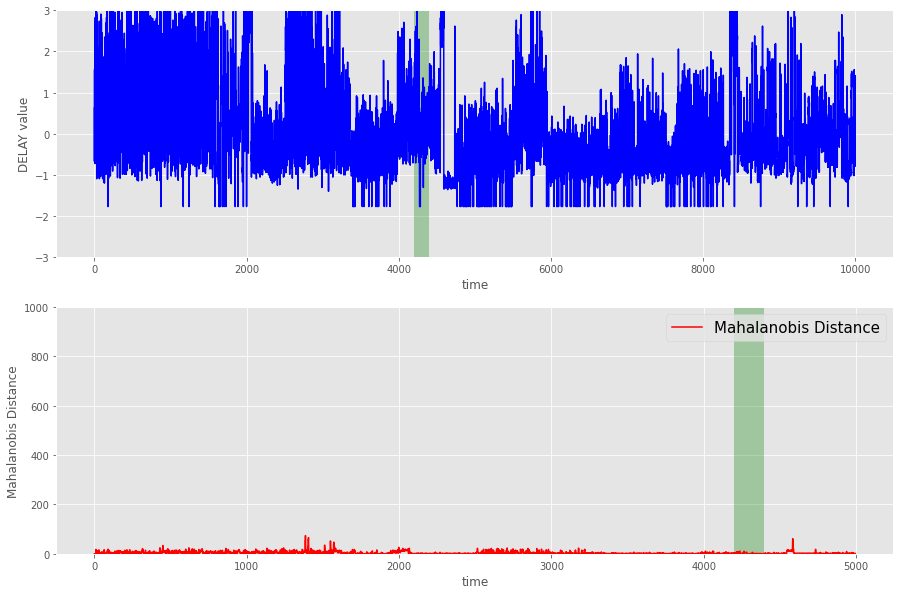

In [50]:
m_dist = [0]*look_back 
for e in errors:
    m_dist.append(Mahala_distantce(e,mean,cov))

fig, axes = plt.subplots(nrows=2, figsize=(15,10))

axes[0].plot(std_DELAY[:10000],color='b',label='original data')
axes[0].set_xlabel('time')
axes[0].set_ylabel('DELAY value' )
axes[0].set_ylim(-3, 3)
x = np.arange(4200,4400)
y1 = [-3]*len(x)
y2 = [3]*len(x)
axes[0].fill_between(x, y1, y2, facecolor='g', alpha=.3)

axes[1].plot(m_dist, color='r',label='Mahalanobis Distance')
axes[1].set_xlabel('time')
axes[1].set_ylabel('Mahalanobis Distance')
axes[1].set_ylim(0, 1000)
y1 = [0]*len(x)
y2 = [1000]*len(x)
axes[1].fill_between(x, y1, y2, facecolor='g', alpha=.3)

plt.legend(fontsize=15)
plt.show()